# EDA - MOE vs N
How does the warehouse metrics vary with number of order lists?
* This will tell us how many order lists are necessary to get reasonably accurate estimates of how good a warehouse configuration is

In [1]:
import random
import csv
import json
import os
import numpy as np
from matplotlib import pyplot as plt
from colorama import Fore, Style, init
import statistics
import math
import pandas as pd
import glob

### Datagen - Create N order lists

In [2]:
# Read the CSV data from the file
def load_order_history(input_file):
    file_path = 'data/order_history_small.csv'
    items = []

    with open(file_path, mode='r') as file:
        reader = csv.DictReader(file)
        for row in reader:
            items.append({
                "id": int(row["id"]),
                "name": row["name"],
                "quantity": int(row["quantity"]),
                "volume": int(row["volume"]),
                "cover": int(row["cover"])
            })

    total_quantity_6m = sum([item['quantity'] for item in items])
    item_probabilities = [item['quantity'] / total_quantity_6m for item in items]

    return items, item_probabilities

# Generate orders
def generate_orders(num_orders, items, item_probabilities):
    orders = []
    for _ in range(num_orders):
        num_items_in_order = random.randint(1, 5)  # Each order can have between 1 and 5 items
        order_items = random.choices(items, weights=item_probabilities, k=num_items_in_order)
        orders.append({"items": order_items})
    return orders

def gen_order_list(num_orders, file_num, items, item_probabilities):
    # Generate a list of orders
    orders = generate_orders(num_orders, items, item_probabilities)

    # Save the orders to a JSON file
    with open(f'data/orders/orders{file_num}.json', 'w') as json_file:
        json.dump(orders, json_file, indent=4)

def datagen(num_order_lists, sample_size):
    items, item_probabilities = load_order_history("data/order_history_small.csv")
    for file_num in range(num_order_lists):
        gen_order_list(sample_size, file_num, items, item_probabilities)

In [3]:
def clear_directory(directory_path):
    # Ensure the directory exists
    if not os.path.isdir(directory_path):
        print(f"Directory {directory_path} does not exist.")
        return

    # Use glob to match all files in the directory
    files = glob.glob(os.path.join(directory_path, '*'))
    
    # Loop through and delete each file
    for file in files:
        try:
            os.remove(file)
            # print(f"Deleted {file}")
        except Exception as e:
            print(f"Error deleting file {file}: {e}")

### WMS Master - Create wms-random.csv

In [4]:
from classes.CellIterator import CellIterator
from classes.Item import Item
from classes.Worker import Worker
from classes.Warehouse import Warehouse

In [5]:
NUM_BAYS = 6
RACK_LENGTH = 15
CELLS_PER_BAY = 20
CELL_LENGTH = RACK_LENGTH / CELLS_PER_BAY
RACK_WIDTH = 0.8
BAY_WIDTH = RACK_WIDTH / 2
LEVEL_HEIGHT = 0.2

WHR = Warehouse(
    NUM_BAYS,
    RACK_LENGTH,
    CELLS_PER_BAY,
    BAY_WIDTH,
    LEVEL_HEIGHT
)

WHS = Warehouse(
    NUM_BAYS,
    RACK_LENGTH,
    CELLS_PER_BAY,
    BAY_WIDTH,
    LEVEL_HEIGHT
)

In [6]:
def margin_of_error(std_dev, sample_size, z_score=1.96):
    return z_score * (std_dev / math.sqrt(sample_size))

def log_total_cells_to_csv(costs, file_path):
    # Ensure the directory exists
    os.makedirs(os.path.dirname(file_path), exist_ok=True)

    # Check if the file exists
    file_exists = os.path.isfile(file_path)
    
    # Open the file in append mode
    with open(file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        
        # If the file doesn't exist, write the header
        if not file_exists:
            headers = ['n'] + [f'cst{i+1}' for i in range(len(costs))] + ['avg', 'min', 'max', 'std', 'moe']
            writer.writerow(headers)

        # Get the trial number
        if file_exists:
            # Read the existing data to determine the trial number
            with open(file_path, mode='r') as read_file:
                reader = csv.reader(read_file)
                rows = list(reader)
                trial_number = len(rows)  # Assuming the header is included, this will give the next trial number
        else:
            trial_number = 1

        # Calculate average, minimum, maximum, and variance
        avg_cost = sum(costs) / len(costs)
        min_cost = min(costs)
        max_cost = max(costs)
        std_cost = round(math.sqrt(statistics.variance(costs)) if len(costs) > 1 else 0, 2)
        moe_cost = round(margin_of_error(std_cost, len(costs)), 2)

        # Write the new record
        writer.writerow([trial_number] + costs + [avg_cost, min_cost, max_cost, std_cost, moe_cost])

def wms_runner(WH, type):
    WH.generate_item_list_small("./data/order_history_small.csv")
    
    # create a warehouse configuration (random / smart)
    if type == "random": WH.sprinkle_aisle()
    elif type == "smart": WH.smart_sprinkle()

    directory = 'data/orders'
    costs = []

    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)
        if not os.path.isfile(file_path): continue

        WH.read_orders(file_path)
        WH.dist_batched_order_list()

        for worker in WH.workers: worker.min_max_order_list(WH.aisle_items)

        total_cells = 0
        for worker in WH.workers:
            worker.fulfill_batched_order()
            total_cells += worker.cells_travelled

        costs.append(total_cells)
        WH.reset("soft")

    if type == "random": log_total_cells_to_csv(costs, "results/wms-random.csv")
    if type == "smart": log_total_cells_to_csv(costs, "results/wms-smart.csv")

    WH.reset("hard")

In [7]:
def delete_file(file):
    if os.path.exists(file):
        os.remove(file)
        # print(f"{file} has been deleted successfully.")
    else:
        print(f"{file} does not exist.")

### EDA

In [8]:
RESULTS_PATH = "results/"
results_random_path = os.path.join(RESULTS_PATH, "wms-random.csv")
results_smart_path = os.path.join(RESULTS_PATH, "wms-smart.csv")

In [9]:
# Define the path for the new CSV file
summary_path = os.path.join(RESULTS_PATH, "wms-orderlist.csv")

# Create a new DataFrame with the required columns if it doesn't exist already
if not os.path.exists(summary_path):
    df_summary = pd.DataFrame(columns=["num_order_lists", "avg", "min", "max", "std", "moe"])
    df_summary.to_csv(summary_path, index=False)
    # print("wms-orderlist created!")
else:
    df_summary = pd.read_csv(summary_path)
    # print("wms-orderlist exists")

In [10]:
# Function to add a new record to the summary DataFrame
def add_summary_record(df):
    num_order_lists = df.shape[1] - 6  # Number of cost columns, subtract 'n' and 'avg' columns
    avg_avg = df['avg'].mean()
    avg_min = df['min'].mean()
    avg_max = df['max'].mean()
    avg_std = df['std'].mean()
    avg_moe = df['moe'].mean()
    
    new_record = {
        "num_order_lists": num_order_lists,
        "avg": avg_avg,
        "min": avg_min,
        "max": avg_max,
        "std": avg_std,
        "moe": avg_moe
    }
    
    new_record_df = pd.DataFrame([new_record])
    
    global df_summary
    df_summary = pd.concat([df_summary, new_record_df], ignore_index=True)
    df_summary.to_csv("results/wms-orderlist.csv", index=False)
    print("New record added successfully!")

## WMS EDA Runner

In [11]:
def wms_eda_orderlist(max_order_lists, sample_size):
    WHR.reset(type="hard")
    delete_file("results/wms-orderlist.csv")
    delete_file("results/wms-random.csv")
    
    for num_order_lists in range(1, max_order_lists + 1):
        # generate order files
        clear_directory('data/orders/')
        datagen(num_order_lists=num_order_lists, sample_size=100)

        # generate wms-random.csv
        for _ in range(sample_size):
            wms_runner(WHR, type="random")

        # eda
        summary_path = os.path.join(RESULTS_PATH, "wms-orderlist.csv")

        # Create a new DataFrame with the required columns if it doesn't exist already
        if not os.path.exists(summary_path):
            df_summary = pd.DataFrame(columns=["num_order_lists", "avg", "min", "max", "std", "moe"])
            df_summary.to_csv(summary_path, index=False)
            # print("wms-orderlist created!")
        else:
            df_summary = pd.read_csv(summary_path)
            # print("wms-orderlist exists")

        


        df_random = pd.read_csv(results_random_path)
        add_summary_record(df_random)

        delete_file("results/wms-random.csv")

In [12]:
wms_eda_orderlist(
    max_order_lists=50,
    sample_size=500
)

results/wms-random.csv does not exist.


C:\Users\AbhayAndanagouda\AppData\Local\Temp\ipykernel_14724\2409874178.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_summary = pd.concat([df_summary, new_record_df], ignore_index=True)


New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New record added successfully!
New reco

## Visualization

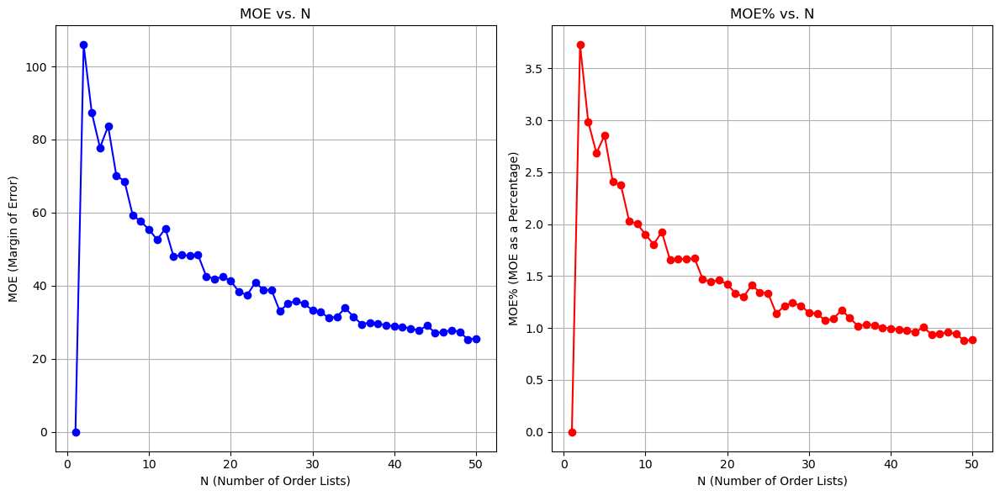

In [2]:
# Load the data from the CSV file
file_path = "results/wms-orderlist.csv"
df = pd.read_csv(file_path)

# Calculate MOE as a percentage of AVG
df['moe_percent'] = (df['moe'] / df['avg']) * 100

# Plot MOE against num_order_lists (N)
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(df['num_order_lists'], df['moe'], marker='o', linestyle='-', color='b')
plt.xlabel('N (Number of Order Lists)')
plt.ylabel('MOE (Margin of Error)')
plt.title('MOE vs. N')
plt.grid(True)

# Plot MOE percentage against num_order_lists (N)
plt.subplot(1, 2, 2)
plt.plot(df['num_order_lists'], df['moe_percent'], marker='o', linestyle='-', color='r')
plt.xlabel('N (Number of Order Lists)')
plt.ylabel('MOE% (MOE as a Percentage)')
plt.title('MOE% vs. N')
plt.grid(True)

plt.tight_layout()
plt.show()

In [2]:
print("hello")

hello


### Remarks
* MOE reaches the 1% mark for 40 order lists
* Diminishing returns - MOE does not improve much for more than 40 order lists
* Ideal number of order lists = 40